<a href="https://colab.research.google.com/github/yuki190384/Challenge-Telecom-X-parte-1/blob/main/TelecomX_LATAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#📌 Extracción

In [ ]:
import pandas as pd
import matplotlib as ptl
import seaborn as sns
import numpy as np
import json
from google.colab import files

In [ ]:
with open('/content/TelecomX_Data.json', 'r', encoding= 'utf-8') as f:
  data = json.load(f)
  print(json.dumps(data, indent=4, ensure_ascii=False))

[
    {
        "customerID": "0002-ORFBO",
        "Churn": "No",
        "customer": {
            "gender": "Female",
            "SeniorCitizen": 0,
            "Partner": "Yes",
            "Dependents": "Yes",
            "tenure": 9
        },
        "phone": {
            "PhoneService": "Yes",
            "MultipleLines": "No"
        },
        "internet": {
            "InternetService": "DSL",
            "OnlineSecurity": "No",
            "OnlineBackup": "Yes",
            "DeviceProtection": "No",
            "TechSupport": "Yes",
            "StreamingTV": "Yes",
            "StreamingMovies": "No"
        },
        "account": {
            "Contract": "One year",
            "PaperlessBilling": "Yes",
            "PaymentMethod": "Mailed check",
            "Charges": {
                "Monthly": 65.6,
                "Total": "593.3"
            }
        }
    },
    {
        "customerID": "0003-MKNFE",
        "Churn": "No",
        "customer": {
            "gen

#🔧 Transformación

In [ ]:
if isinstance(data, dict):
  df = pd.json_normalize(data)

else:
  df = pd.DataFrame(data)

print(df.head)

<bound method NDFrame.head of       customerID Churn                                           customer  \
0     0002-ORFBO    No  {'gender': 'Female', 'SeniorCitizen': 0, 'Part...   
1     0003-MKNFE    No  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
2     0004-TLHLJ   Yes  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
3     0011-IGKFF   Yes  {'gender': 'Male', 'SeniorCitizen': 1, 'Partne...   
4     0013-EXCHZ   Yes  {'gender': 'Female', 'SeniorCitizen': 1, 'Part...   
...          ...   ...                                                ...   
7262  9987-LUTYD    No  {'gender': 'Female', 'SeniorCitizen': 0, 'Part...   
7263  9992-RRAMN   Yes  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
7264  9992-UJOEL    No  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
7265  9993-LHIEB    No  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   
7266  9995-HOTOH    No  {'gender': 'Male', 'SeniorCitizen': 0, 'Partne...   

                                             

In [ ]:
df.columns

Index(['customerID', 'Churn', 'customer', 'phone', 'internet', 'account'], dtype='object')

In [ ]:
df.isnull().sum()

,0
customerID,0
Churn,0
customer,0
phone,0
internet,0
account,0


In [ ]:
df.fillna(0, inplace=True)

In [ ]:
df.dropna(how='all', inplace=True)

In [ ]:
print("\n DataFrame limpio y con nuevas columnas:")
df.head()


 DataFrame limpio y con nuevas columnas:


,customerID,Churn,customer,phone,internet,account
0,0002-ORFBO,No,"{'gender': 'Female', 'SeniorCitizen': 0, 'Part...","{'PhoneService': 'Yes', 'MultipleLines': 'No'}","{'InternetService': 'DSL', 'OnlineSecurity': '...","{'Contract': 'One year', 'PaperlessBilling': '..."
1,0003-MKNFE,No,"{'gender': 'Male', 'SeniorCitizen': 0, 'Partne...","{'PhoneService': 'Yes', 'MultipleLines': 'Yes'}","{'InternetService': 'DSL', 'OnlineSecurity': '...","{'Contract': 'Month-to-month', 'PaperlessBilli..."
2,0004-TLHLJ,Yes,"{'gender': 'Male', 'SeniorCitizen': 0, 'Partne...","{'PhoneService': 'Yes', 'MultipleLines': 'No'}","{'InternetService': 'Fiber optic', 'OnlineSecu...","{'Contract': 'Month-to-month', 'PaperlessBilli..."
3,0011-IGKFF,Yes,"{'gender': 'Male', 'SeniorCitizen': 1, 'Partne...","{'PhoneService': 'Yes', 'MultipleLines': 'No'}","{'InternetService': 'Fiber optic', 'OnlineSecu...","{'Contract': 'Month-to-month', 'PaperlessBilli..."
4,0013-EXCHZ,Yes,"{'gender': 'Female', 'SeniorCitizen': 1, 'Part...","{'PhoneService': 'Yes', 'MultipleLines': 'No'}","{'InternetService': 'Fiber optic', 'OnlineSecu...","{'Contract': 'Month-to-month', 'PaperlessBilli..."


In [ ]:
def flatten_json(df):
    df_result = df.copy()
    changed = True

    while changed:
        changed = False
        for col in df_result.columns:

            if df_result[col].apply(lambda x: isinstance(x, dict)).any():
                changed = True
                df_normalized = pd.json_normalize(df_result[col])
                df_normalized.columns = [f"{col}_{subcol}" for subcol in df_normalized.columns]
                df_result = pd.concat([df_result.drop(columns=[col]), df_normalized], axis=1)

            elif df_result[col].apply(lambda x: isinstance(x, list)).any():
                changed = True
                max_len = df_result[col].apply(lambda x: len(x) if isinstance(x, list) else 0).max()
                for i in range(max_len):
                    df_result[f"{col}_{i}"] = df_result[col].apply(lambda x: x[i] if isinstance(x, list) and i < len(x) else None)
                df_result = df_result.drop(columns=[col])

    return df_result

In [ ]:
df_flat = flatten_json(df)
print("\n /content/TelecomX_Data.json(diccionarios y listas):")
print(df_flat.head())


 /content/TelecomX_Data.json(diccionarios y listas):
   customerID Churn customer_gender  customer_SeniorCitizen customer_Partner  \
0  0002-ORFBO    No          Female                       0              Yes   
1  0003-MKNFE    No            Male                       0               No   
2  0004-TLHLJ   Yes            Male                       0               No   
3  0011-IGKFF   Yes            Male                       1              Yes   
4  0013-EXCHZ   Yes          Female                       1              Yes   

  customer_Dependents  customer_tenure phone_PhoneService phone_MultipleLines  \
0                 Yes                9                Yes                  No   
1                  No                9                Yes                 Yes   
2                  No                4                Yes                  No   
3                  No               13                Yes                  No   
4                  No                3                Yes   

In [ ]:
output_filename = "datos_limpios.csv"
df_flat.to_csv(output_filename, index=False, encoding="utf-8-sig")
files.download(output_filename)
print(f"datos_limpios'{output_filename}' exportado y listo para descargar.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

datos_limpios'datos_limpios.csv' exportado y listo para descargar.


In [ ]:
df = pd.read_csv("datos_limpios.csv")
df.head()

,customerID,Churn,customer_gender,customer_SeniorCitizen,customer_Partner,customer_Dependents,customer_tenure,phone_PhoneService,phone_MultipleLines,internet_InternetService,...,internet_OnlineBackup,internet_DeviceProtection,internet_TechSupport,internet_StreamingTV,internet_StreamingMovies,account_Contract,account_PaperlessBilling,account_PaymentMethod,account_Charges.Monthly,account_Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


#📊 Carga y análisis

In [ ]:
df = pd.read_csv("datos_limpios.csv")
df.head()

,customerID,Churn,customer_gender,customer_SeniorCitizen,customer_Partner,customer_Dependents,customer_tenure,phone_PhoneService,phone_MultipleLines,internet_InternetService,...,internet_OnlineBackup,internet_DeviceProtection,internet_TechSupport,internet_StreamingTV,internet_StreamingMovies,account_Contract,account_PaperlessBilling,account_PaymentMethod,account_Charges.Monthly,account_Charges.Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,...,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,...,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,...,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,...,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7267 entries, 0 to 7266
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   customerID                 7267 non-null   object 
 1   Churn                      7043 non-null   object 
 2   customer_gender            7267 non-null   object 
 3   customer_SeniorCitizen     7267 non-null   int64  
 4   customer_Partner           7267 non-null   object 
 5   customer_Dependents        7267 non-null   object 
 6   customer_tenure            7267 non-null   int64  
 7   phone_PhoneService         7267 non-null   object 
 8   phone_MultipleLines        7267 non-null   object 
 9   internet_InternetService   7267 non-null   object 
 10  internet_OnlineSecurity    7267 non-null   object 
 11  internet_OnlineBackup      7267 non-null   object 
 12  internet_DeviceProtection  7267 non-null   object 
 13  internet_TechSupport       7267 non-null   objec

In [ ]:
df.describe()

,customer_SeniorCitizen,customer_tenure,account_Charges.Monthly
count,7267.000000,7267.000000,7267.000000
mean,0.162653,32.346498,64.720098
std,0.369074,24.571773,30.129572
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.425000
50%,0.000000,29.000000,70.300000
75%,0.000000,55.000000,89.875000
max,1.000000,72.000000,118.750000


In [ ]:
print("\n Distribución de Churn:")
df['Churn'].value_counts()
print("\n Porcentaje de Churn:")
df['Churn'].value_counts(normalize=True) * 100



 Distribución de Churn:

 Porcentaje de Churn:


,proportion
Churn,
No,73.463013
Yes,26.536987


In [ ]:
print("\n Estadísticas descriptivas:")
display(df.describe())




 Estadísticas descriptivas:


,customer_SeniorCitizen,customer_tenure,account_Charges.Monthly
count,7267.000000,7267.000000,7267.000000
mean,0.162653,32.346498,64.720098
std,0.369074,24.571773,30.129572
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.425000
50%,0.000000,29.000000,70.300000
75%,0.000000,55.000000,89.875000
max,1.000000,72.000000,118.750000


In [ ]:
df.customer_gender.unique()

array(['Female', 'Male'], dtype=object)

#📄Informe final

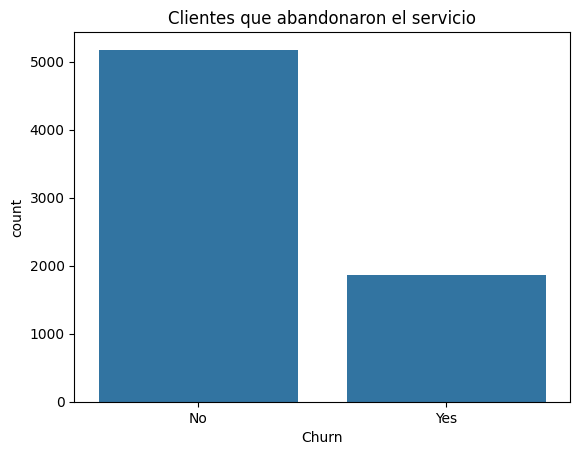

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


sns.countplot(data=df, x='Churn')
plt.title('Clientes que abandonaron el servicio')
plt.show()

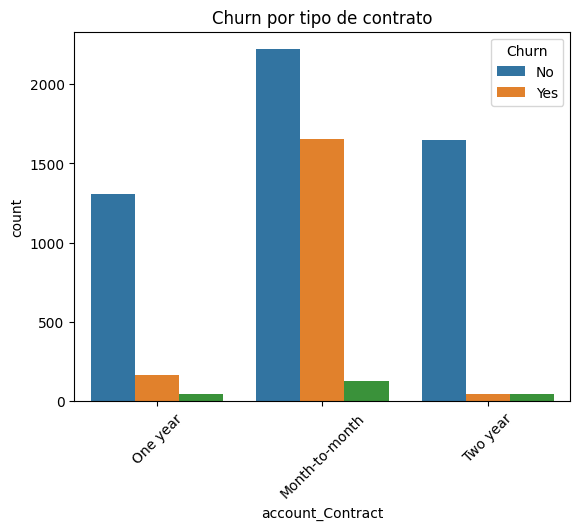

In [ ]:
sns.countplot(data=df_flat, x='account_Contract', hue='Churn')
plt.title('Churn por tipo de contrato')
plt.xticks(rotation=45)
plt.show()

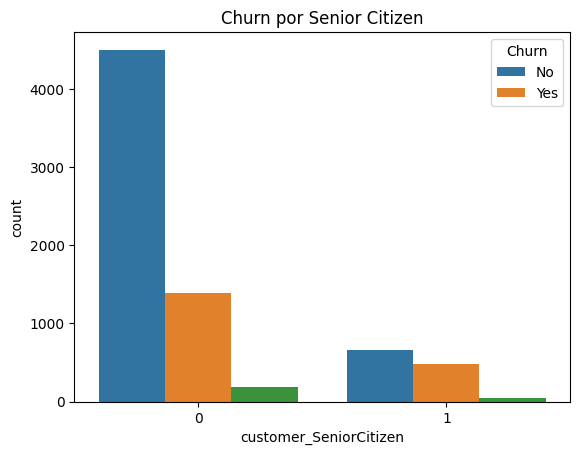

In [ ]:
sns.countplot(data=df_flat, x='customer_SeniorCitizen', hue='Churn')
plt.title('Churn por Senior Citizen')
plt.show()

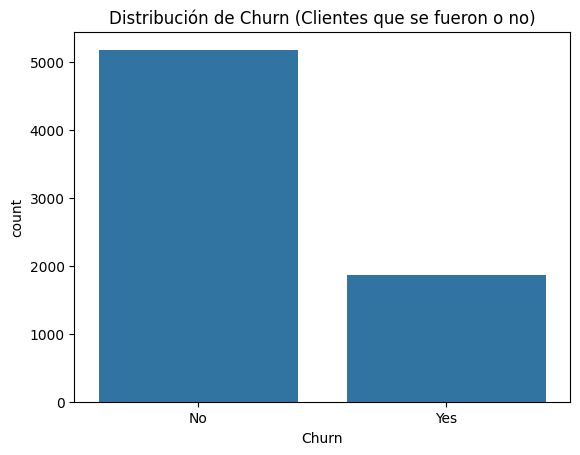

In [ ]:
sns.countplot(data=df, x='Churn')
plt.title('Distribución de Churn (Clientes que se fueron o no)')
plt.show()

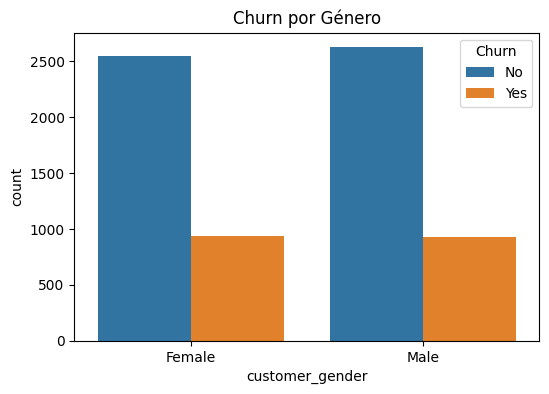

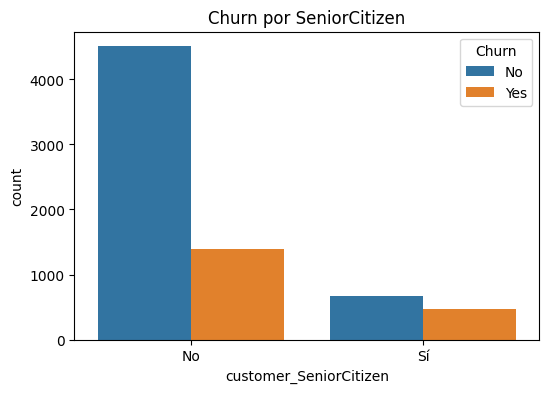

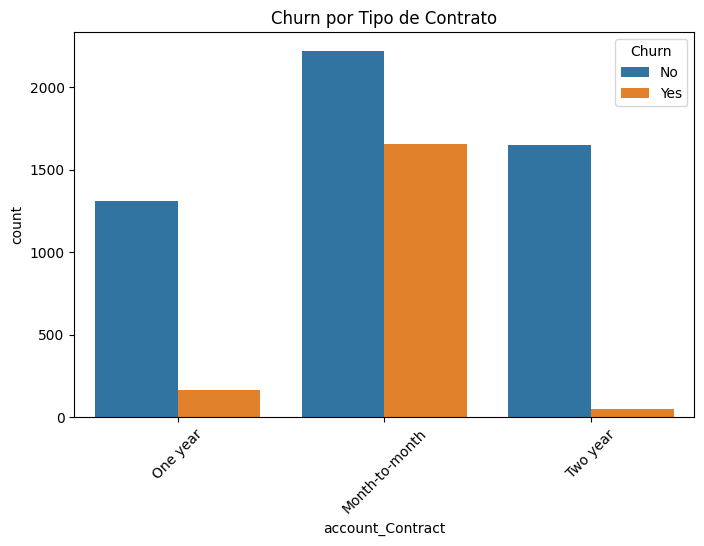

In [ ]:
# === ANÁLISIS CATEGÓRICOS VS CHURN ===
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='customer_gender', hue='Churn')
plt.title('Churn por Género')
plt.show()

plt.figure(figsize=(6,4))
sns.countplot(data=df, x='customer_SeniorCitizen', hue='Churn')
plt.title('Churn por SeniorCitizen')
plt.xticks([0,1], ['No', 'Sí'])
plt.show()

plt.figure(figsize=(8,5))
sns.countplot(data=df, x='account_Contract', hue='Churn')
plt.title('Churn por Tipo de Contrato')
plt.xticks(rotation=45)
plt.show()
